# Business Understanding

Compare director, genre, and rating to each other to better understand the data overall.
Goal; maximixe profit. Large investment that could pay off, suggest especially good directors

Using rating as an indicator of profit; but it is an imperfect indicator

# START FINAL NOTEBOOK CODE

In [1]:
import pandas as pd
import sqlite3
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [2]:
con = sqlite3.connect('../../zippedData/im.db')

In [55]:
filteredDirectors = pd.read_sql("""

SELECT p.primary_name AS name,
    AVG(mr.averagerating) as averageRating,
    COUNT(mb.movie_id) AS movieCount
FROM movie_basics AS mb
    JOIN movie_ratings AS mr
        ON mr.movie_id = mb.movie_id
    JOIN directors AS d
        ON mr.movie_id = d.movie_id
    JOIN persons AS p
        ON d.person_id = p.person_id
WHERE p.death_year IS NULL
GROUP BY d.person_id
--HAVING movie_count > 9
HAVING mr.numvotes > 500
ORDER BY averageRating DESC

""",con)

In [56]:
filteredDirectors

,name,averageRating,movieCount
0,Arsel Arumugam,9.70,1
1,Karzan Kardozi,9.60,1
2,Abhinav Thakur,9.60,1
3,Sudheer Shanbhogue,9.60,1
4,Lauren Ross,9.50,3
...,...,...,...
8373,Lukasz Karwowski,1.40,3
8374,Gökhan Gök,1.30,3
8375,Keiko Tsuruoka,1.25,8
8376,Naoyoshi Kawamatsu,1.10,2


In [57]:
messyDirectorGenres = pd.read_sql("""

SELECT mb.genres,
    p.primary_name AS directorName
FROM movie_basics AS mb
    JOIN directors AS d
        ON mb.movie_id = d.movie_id
    JOIN persons as p
        ON p.person_id = d.person_id

""",con)

In [58]:
directorGenres = messyDirectorGenres.dropna()

In [59]:
directorGenres['genres'] = directorGenres['genres'].str.split(',')

<ipython-input-59-1c63bab6135f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  directorGenres['genres'] = directorGenres['genres'].str.split(',')


In [60]:
directorGenreDict = directorGenres.explode('genres').groupby("directorName")['genres'].agg(['unique']).to_dict()

In [61]:
uniqueDirectorGenres = pd.DataFrame.from_dict(data=directorGenreDict)

In [62]:
directordf = filteredDirectors.merge(uniqueDirectorGenres,how='inner',left_on='name',right_on=uniqueDirectorGenres.index)

In [63]:
directordf['genres'] = directordf['unique']
directordf = directordf.drop(labels='unique',axis=1)

In [64]:
directorRatings = pd.read_sql("""

SELECT p.primary_name AS name,
    AVG(averagerating) AS averageRating,
    COUNT(mb.movie_id) AS movieCount
FROM movie_basics AS mb
    JOIN movie_ratings AS mr
        ON mr.movie_id = mb.movie_id
    JOIN directors AS d
        ON mr.movie_id = d.movie_id
    JOIN persons AS p
        ON d.person_id = p.person_id
GROUP BY d.person_id
HAVING movieCount > 9

""",con)
directorRatings

,name,averageRating,movieCount
0,Luc Besson,6.230769,13
1,Kenneth Branagh,6.850000,18
2,George Clooney,6.190909,11
3,Clint Eastwood,6.588889,18
4,Ron Howard,6.831250,16
...,...,...,...
2970,Nuo Wang,9.100000,10
2971,Jared Worthen,5.000000,14
2972,Michael Rogers,5.300000,21
2973,Carlos Villafaina,7.200000,17


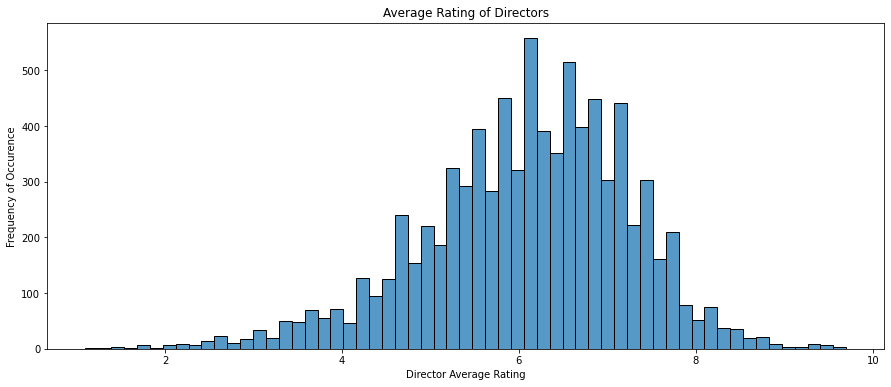

In [65]:
fig,ax = plt.subplots(figsize=(15,6))

sns.histplot(data=directordf,x='averageRating')
ax.set(title='Average Rating of Directors',xlabel='Director Average Rating',ylabel='Frequency of Occurence');

In [66]:
usedf = directordf[directordf['movieCount'] > 4]

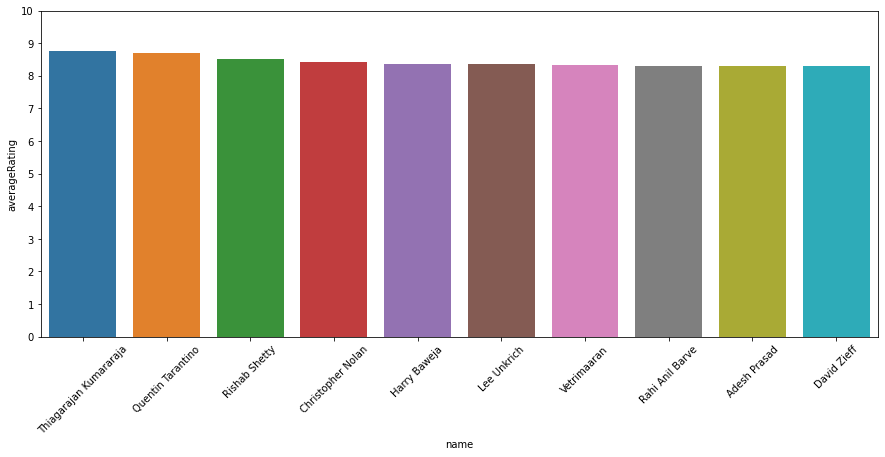

In [67]:
fig,ax = plt.subplots(figsize=(15,6))

sns.barplot(data=usedf[:10],x='name',y='averageRating')
plt.xticks(rotation=45);
plt.yticks(range(11));

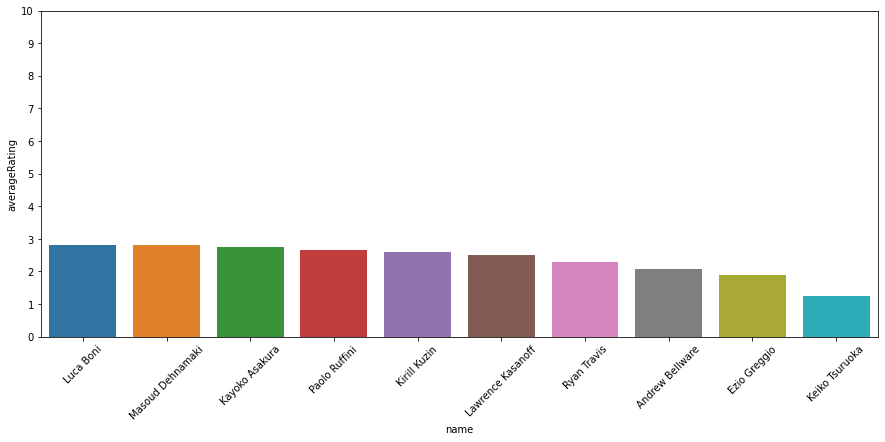

In [68]:
fig,ax = plt.subplots(figsize=(15,6))

sns.barplot(data=usedf[-10:],x='name',y='averageRating')
plt.xticks(rotation=45);
plt.yticks(range(11));

In [69]:
uniqueGenreData = pd.read_sql("""

SELECT mr.averagerating AS rating,
    mb.genres,
    mb.primary_title AS title
FROM movie_basics AS mb
    JOIN movie_ratings AS mr
        ON mb.movie_id = mr.movie_id
WHERE numvotes > 500

""",con)

uniqueGenreData['genres'] = uniqueGenreData['genres'].str.split(',')

In [70]:
singleGenreRatings = uniqueGenreData.explode('genres').groupby('genres').agg(['mean'])

In [71]:
singleGenreRatings['averageRating'] = singleGenreRatings[('rating','mean')]
singleGenreRatings = singleGenreRatings.drop(labels=('rating','mean'),axis=1)

In [72]:
singleGenreRatings = singleGenreRatings.sort_values('averageRating',ascending=False)

In [74]:
singleGenreRatings

,averageRating
,
genres,
News,7.530556
Documentary,7.196806
Biography,6.937696
History,6.787313
Sport,6.786643
Music,6.722306
Animation,6.559959
Musical,6.463889


In [85]:
usedf[usedf['averageRating'] >= 8.0]

,name,averageRating,movieCount,genres
48,Thiagarajan Kumararaja,8.760000,5,"[Action, Crime, Thriller, Drama]"
55,Quentin Tarantino,8.700000,5,"[Drama, Western, Crime, Mystery, Action, Thril..."
81,Rishab Shetty,8.500000,10,"[Romance, Thriller, Comedy, Drama, Family]"
93,Christopher Nolan,8.437500,8,"[Adventure, Drama, Sci-Fi, Action, Thriller, H..."
114,Harry Baweja,8.360000,5,"[Animation, History]"
116,Lee Unkrich,8.350000,8,"[Adventure, Animation, Comedy, Action]"
117,Vetrimaaran,8.340000,5,"[Action, Drama, Sport, Crime, Thriller]"
119,Rahi Anil Barve,8.300000,5,"[Drama, Fantasy, Horror]"
129,Adesh Prasad,8.300000,5,"[Drama, Fantasy, Horror]"
136,David Zieff,8.300000,5,"[Adventure, Biography, Documentary]"


In [81]:
for genreList in usedf['genres'][:5]:
    genreString = ''
    for genre in genreList:
        genreString += genre + ' '
    print(genreString)

Action Crime Thriller Drama 
Drama Western Crime Mystery Action Thriller Comedy 
Romance Thriller Comedy Drama Family 
Adventure Drama Sci-Fi Action Thriller History 
Animation History 


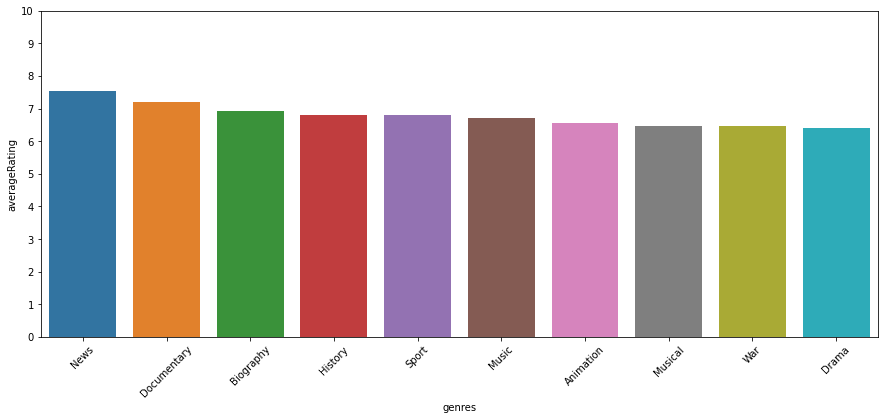

In [22]:
fig,ax = plt.subplots(figsize=(15,6))

sns.barplot(data=singleGenreRatings[:10],x=singleGenreRatings.index[:10],y='averageRating')

plt.xticks(rotation=45);
plt.yticks(range(11));

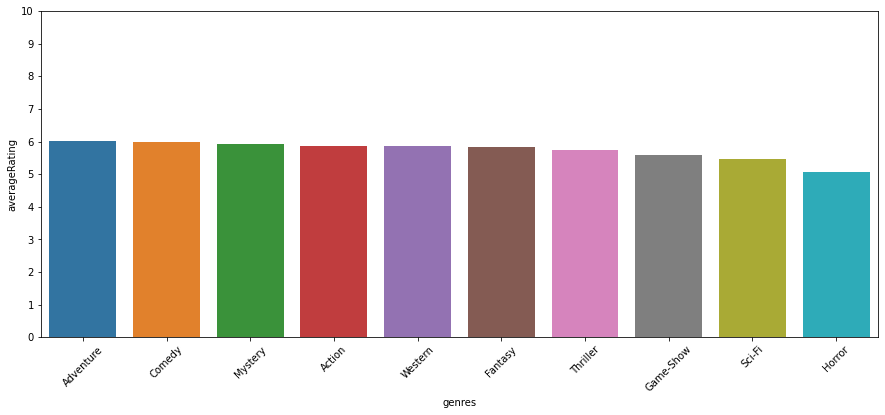

In [30]:
fig,ax = plt.subplots(figsize=(15,6))

sns.barplot(data=singleGenreRatings[-10:],x=singleGenreRatings.index[-10:],y='averageRating')

plt.xticks(rotation=45);
plt.yticks(range(11));

In [51]:
for genreList in usedf['genres'][:5]:
    print(genreList)

['Action' 'Crime' 'Thriller' 'Drama']
['Drama' 'Western' 'Crime' 'Mystery' 'Action' 'Thriller' 'Comedy']
['Romance' 'Thriller' 'Comedy' 'Drama' 'Family']
['Adventure' 'Drama' 'Sci-Fi' 'Action' 'Thriller' 'History']
['Animation' 'History']


# END FINAL NOTEBOOK CODE

In [12]:
pd.read_sql("""

SELECT p.primary_name AS name,
    mb.start_year
FROM movie_basics AS mb
    JOIN movie_ratings AS mr
        ON mr.movie_id = mb.movie_id
    JOIN directors AS d
        ON mr.movie_id = d.movie_id
    JOIN persons AS p
        ON d.person_id = p.person_id

""",con)['start_year'].describe()

count    181387.000000
mean       2014.309802
std           2.536111
min        2010.000000
25%        2012.000000
50%        2014.000000
75%        2016.000000
max        2019.000000
Name: start_year, dtype: float64

In [115]:
testdf = messyDirectorGenres

In [116]:
testdf['genres'] = testdf['genres'].str.split(',')

In [118]:
testdf.explode('genres')

,genres,directorName
0,Action,Harnam Singh Rawail
0,Crime,Harnam Singh Rawail
0,Drama,Harnam Singh Rawail
1,Action,Harnam Singh Rawail
1,Crime,Harnam Singh Rawail
...,...,...
291166,None,Kiran Gawade
291167,Documentary,Vinicius Augusto Bozzo
291168,Documentary,Vinicius Augusto Bozzo
291169,Documentary,Angela Gurgel


In [297]:
uniqueGenreData.shape

(13880, 3)

In [21]:
directorRatings

,name,averageRating
0,Orson Welles,6.900000
1,Woody Allen,6.700000
2,Luc Besson,6.230769
3,Kenneth Branagh,6.850000
4,John Carpenter,5.600000
...,...,...
57236,Dahl Lee,8.400000
57237,Dongwoo Ko,8.400000
57238,Hepi Mita,7.300000
57239,Laura Cazador,8.500000


In [73]:
directordf

,name,averageRating,movieCount,unique
0,Corey Lubowich,9.100000,12,"[Comedy, Musical]"
1,Dennis Korbylo,9.000000,28,"[Documentary, Family, News]"
2,Erin Korbylo,9.000000,28,"[Documentary, Family, News]"
3,Sylvia Broeckx,9.000000,28,"[Documentary, Family, News]"
4,Lisa Gossels,9.000000,17,[Documentary]
...,...,...,...,...
2954,Brett Kelly,1.403704,27,"[Action, Sci-Fi, Comedy, Fantasy, Western, Adv..."
2955,Chihiro Ikeda,1.300000,13,"[Comedy, Drama, Romance]"
2956,Eldar Bogunov,1.295652,23,"[Horror, Crime, Drama, Thriller, Comedy]"
2957,Andrey Gromov,1.081818,11,"[Horror, Mystery, Thriller, Adventure, Comedy,..."


In [62]:
filteredDirectors

,name,averageRating,movieCount
0,Nuo Wang,9.100000,10
1,Corey Lubowich,9.100000,12
2,Dennis Korbylo,9.000000,28
3,Erin Korbylo,9.000000,28
4,Sylvia Broeckx,9.000000,28
...,...,...,...
2970,Brett Kelly,1.403704,27
2971,Chihiro Ikeda,1.300000,13
2972,Eldar Bogunov,1.295652,23
2973,Andrey Gromov,1.081818,11


In [63]:
uniqueDirectorGenres

,unique
'Atlas' Ramachandran,[Drama]
A Fernandez,"[Documentary, Drama]"
A Normale Jef,"[Comedy, Horror, Sci-Fi]"
A R Ravindra,"[Adventure, Documentary, Drama]"
A'Ali de Sousa,"[Action, Drama, History]"
...,...
Ümit Ünal,"[Horror, Thriller, Action, Drama, Comedy]"
Þorfinnur Guðnason,[Documentary]
Þorstein J. Vilhjálmsson,[Documentary]
Þórdur Bragi Jónsson,"[Animation, Documentary]"


In [40]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(filteredDirectors)

,name,averageRating,movieCount
0,Nuo Wang,9.100000,10
1,Corey Lubowich,9.100000,12
2,Dennis Korbylo,9.000000,28
3,Erin Korbylo,9.000000,28
4,Sylvia Broeckx,9.000000,28
5,Lisa Gossels,9.000000,17
6,Elizabeth Blake-Thomas,8.671429,14
7,Steve Ravic,8.654545,11
8,Tom Logan,8.610000,10
9,Asem Nasser,8.600000,10


In [5]:
genreRatingMessy = pd.read_sql("""

SELECT mb.genres as genre,
     AVG(mr.averagerating) AS averageRating
FROM movie_basics AS mb
    JOIN movie_ratings AS mr
        ON mr.movie_id = mb.movie_id
GROUP BY genre

""",con)

Clean up genre data, should get 2 databases, one containing multiple genres (per column), one containing one genre (per column)

In [6]:
genreRatingMessy

,genre,averageRating
0,None,6.496144
1,Action,5.757712
2,"Action,Adult,Comedy",4.650000
3,"Action,Adventure",5.223529
4,"Action,Adventure,Animation",6.562874
...,...,...
919,Thriller,5.704244
920,"Thriller,War",5.650000
921,"Thriller,Western",7.150000
922,War,6.134043


Director Genres

In [49]:
directorGenreDict['unique'].keys()

dict_keys(["'Atlas' Ramachandran", 'A Fernandez', 'A Normale Jef', 'A R Ravindra', "A'Ali de Sousa", "A'Shaela Abdon", 'A. Balakrishnan', 'A. Blaine Miller', 'A. Branham Dyer', 'A. Cengiz Mert', 'A. Fishman', 'A. Haluk Unal', 'A. Hassan Keivan', 'A. Jagadesh', 'A. Joji', 'A. Jonathan Benny', 'A. Karunakaran', 'A. Khedron de León', 'A. Lawrence Dreyfuss', 'A. Levent Ungor', 'A. Liong Wong', 'A. Mahadev', 'A. Majid', 'A. Onomen Asikele', 'A. Rappaport', 'A. Razak Mohaideen', 'A. Sarkunam', 'A. Sayeeda Moreno', 'A. Senthil Kumar', 'A. Susan Svehla', 'A. Taner Elhan', 'A. Todd Smith', 'A. Uygur Ozturk', 'A. Venkatesh', 'A.A. Jones', 'A.A. Junaideen', 'A.A. Rocha', 'A.B. Sallu', 'A.B. Shawky', 'A.C. Mughil', 'A.D. Calvo', 'A.D. Freese', 'A.D. Gerhardt', 'A.D. Liano', 'A.D. Oppenheim', 'A.D. Pearson', 'A.D. Smith', 'A.G. Amid', 'A.J. Ager', 'A.J. Ali', 'A.J. Bishop', 'A.J. Bond', 'A.J. Brooks', 'A.J. Callens', 'A.J. Calomay', 'A.J. Detisch', 'A.J. Dirty Stein', 'A.J. Eaton', 'A.J. Edwards', 

In [59]:
uniqueDirectorGenres

,unique
'Atlas' Ramachandran,[Drama]
A Fernandez,"[Documentary, Drama]"
A Normale Jef,"[Comedy, Horror, Sci-Fi]"
A R Ravindra,"[Adventure, Documentary, Drama]"
A'Ali de Sousa,"[Action, Drama, History]"
...,...
Ümit Ünal,"[Horror, Thriller, Action, Drama, Comedy]"
Þorfinnur Guðnason,[Documentary]
Þorstein J. Vilhjálmsson,[Documentary]
Þórdur Bragi Jónsson,"[Animation, Documentary]"


In [44]:
directorGenres['directorName'].nunique()

104795

In [11]:
testdf = pd.DataFrame()

In [12]:
testdf

""


In [13]:
directorList = []

for director in directorGenres['directorName']:
    directorList.append(director)
directorList

['Harnam Singh Rawail',
 'Harnam Singh Rawail',
 'Harnam Singh Rawail',
 'Harnam Singh Rawail',
 'Mani Kaul',
 'Orson Welles',
 'Orson Welles',
 'Hrishikesh Mukherjee',
 'Raoul Ruiz',
 'Raoul Ruiz',
 'Valeria Sarmiento',
 'Valeria Sarmiento',
 'Frank Howson',
 'Mc Jones',
 'Anthony Harrison',
 'José Manuel Alves Pereira',
 'António Loja Neves',
 'Louis van Gasteren',
 'Ágnes Kocsis',
 'Ágnes Kocsis',
 'Miklós Jancsó',
 'John Mulholland',
 'Bence Miklauzic',
 'Bence Miklauzic',
 'Bence Miklauzic',
 'Vera Chytilová',
 'Marcell Jankovics',
 'Marcell Jankovics',
 'Stuart Paul',
 'R.J. Adams',
 'R.J. Adams',
 'R.J. Adams',
 'Thaelman Urgelles',
 'Thaelman Urgelles',
 'Lawrence Kasanoff',
 'Lawrence Kasanoff',
 'Lawrence Kasanoff',
 'Lawrence Kasanoff',
 'Lawrence Kasanoff',
 'Parvez Rana',
 'Alex Monty Canawati',
 'Alex Monty Canawati',
 'Alex Monty Canawati',
 'Vasil Amashukeli',
 'Marcel Lozinski',
 'Serif Gören',
 'Pat Jackson',
 'Vera Chytilová',
 'Christine Wagner',
 'Christine Wagner'

In [14]:
directorList = set(directorList)
directorList = list(directorList)
directorList

['Shyju Anthikkad',
 'Daniele Ciprì',
 'Jason Orbaum',
 'Evandro Souza',
 'Nathalie Ducharme',
 'Ruben Lüüs',
 'Daniel Diosdado',
 'Thu Nga Vu-Lilja',
 'Bennie Woodell',
 'Orkhan Ata',
 'Sasha Louis Vukovic',
 'Peter Nelson',
 'Robin Kempe-Bergman',
 'Bejo Dohmen',
 'David Mucci Fassett',
 'Bruno Lavaine',
 'Arya M. Mahesh',
 'Ari Abraham',
 'Isaac Piche',
 'Luke Radford',
 'Kerstin Übelacker',
 'Aalam-Warqe Davidian',
 'Jan Sonnenmair',
 'Elio Quiroga',
 'Terrance Odette',
 'Bon An',
 'Mike Thifault',
 'Maria Ribeiro',
 'Rex M. Teese',
 'Umesh Chauhan',
 'Sebastián Hiriart',
 'Josefina Recio',
 'Jake Billard',
 'Yûdai Katô',
 'Mitchell Kezin',
 'Manu Bonmariage',
 'Nicolas Pierre Morin',
 'Henry Snyder',
 'Ramón Margareto',
 'Will Wissink',
 'Bruce Endres',
 'Mehran Tamadon',
 'Christian Hockin',
 'Adrienne Bovet',
 'Kadriann Kibus',
 'Derrick Pinkett',
 'Rob Jacobsen',
 'Alex Davis-Lawrence',
 'Chris Koby',
 'Julián Goyoaga',
 'Vince Hughes',
 'David Knight',
 'Germán Tejeira',
 'Riy

In [15]:
testdf['directorName'] = directorList
testdf

,directorName
0,Shyju Anthikkad
1,Daniele Ciprì
2,Jason Orbaum
3,Evandro Souza
4,Nathalie Ducharme
...,...
104790,Miguel Archer
104791,Andrea Vialardi
104792,Tom Surgal
104793,Sérgio Tréfaut


In [39]:
'''directorGenreDict = {}
for director in directorList:
    directorGenreDict[director] = directorGenres.loc[directorGenres['directorName'] == director]['genres'].tolist()
directorGenreDict'''

{'Alejandra Rojo': [['Documentary']],
 'Lili Bai': [['Thriller'],
  ['Horror'],
  ['Crime', 'Horror', 'Thriller'],
  ['Crime', 'Horror', 'Thriller']],
 'Dan Greenstone': [['Documentary']],
 'Rolando Colla': [['Drama', 'Romance'],
  ['Drama', 'Romance'],
  ['Drama', 'Romance'],
  ['Drama', 'Romance'],
  ['Biography', 'Documentary'],
  ['Drama'],
  ['Drama'],
  ['Drama'],
  ['Drama'],
  ['Drama'],
  ['Drama'],
  ['Drama']],
 'Ian Pleasance': [['Documentary'], ['Documentary']],
 'Maggie Lee': [['Biography', 'Documentary']],
 'Younguee Yoo': [['Drama']],
 'Naomi Foner': [['Drama', 'Romance']],
 'Nicole Mosleh': [['Drama']],
 'Big Riff': [['Comedy']],
 'Charles Davis': [['Action', 'Adventure', 'Fantasy'],
  ['Action', 'Adventure', 'Fantasy'],
  ['Horror', 'Thriller'],
  ['Horror'],
  ['Sci-Fi']],
 'Michael Arlen Davis': [['Documentary']],
 'Dante Tanikie-Montagnani': [['Biography', 'Documentary', 'Drama']],
 'Axel Lischke': [['Documentary']],
 'Joyce Fitzpatrick': [['Biography', 'Documentar

In [16]:
testdf['directorGenres'] = directorGenres[]

,directorName
0,Shyju Anthikkad
1,Daniele Ciprì
2,Jason Orbaum
3,Evandro Souza
4,Nathalie Ducharme
...,...
104790,Miguel Archer
104791,Andrea Vialardi
104792,Tom Surgal
104793,Sérgio Tréfaut


In [17]:
directorGenres

,genres,directorName
0,"[Action, Crime, Drama]",Harnam Singh Rawail
1,"[Action, Crime, Drama]",Harnam Singh Rawail
2,"[Action, Crime, Drama]",Harnam Singh Rawail
3,"[Action, Crime, Drama]",Harnam Singh Rawail
4,"[Biography, Drama]",Mani Kaul
...,...,...
291165,[Comedy],Kanchan Nayak
291167,[Documentary],Vinicius Augusto Bozzo
291168,[Documentary],Vinicius Augusto Bozzo
291169,[Documentary],Angela Gurgel


# To Do:
- Get mean of a genre's ratings
- Split genres into distinct entries (leaves many movies counted twice, so also want to use data of co-occurring genres)

# Notes
- 

In [2]:
!ls ../../zippedData/

bom.movie_gross.csv.gz
im.db
im.db.zip
rt.movie_info.tsv.gz
rt.reviews.tsv.gz
tmdb.movies.csv.gz
tn.movie_budgets.csv.gz


In [3]:
movieGrossData = pd.read_csv("../../zippedData/bom.movie_gross.csv.gz")
movieGrossData

,title,studio,domestic_gross,foreign_gross,year
0,Toy Story 3,BV,415000000.0,652000000,2010
1,Alice in Wonderland (2010),BV,334200000.0,691300000,2010
2,Harry Potter and the Deathly Hallows Part 1,WB,296000000.0,664300000,2010
3,Inception,WB,292600000.0,535700000,2010
4,Shrek Forever After,P/DW,238700000.0,513900000,2010
...,...,...,...,...,...
3382,The Quake,Magn.,6200.0,NaN,2018
3383,Edward II (2018 re-release),FM,4800.0,NaN,2018
3384,El Pacto,Sony,2500.0,NaN,2018
3385,The Swan,Synergetic,2400.0,NaN,2018


In [4]:
movieBudgetData = pd.read_csv("../../zippedData/tn.movie_budgets.csv.gz")
movieBudgetData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5782 entries, 0 to 5781
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   id                 5782 non-null   int64 
 1   release_date       5782 non-null   object
 2   movie              5782 non-null   object
 3   production_budget  5782 non-null   object
 4   domestic_gross     5782 non-null   object
 5   worldwide_gross    5782 non-null   object
dtypes: int64(1), object(5)
memory usage: 271.2+ KB


In [5]:
movieBaseData = pd.read_csv("../../zippedData/tmdb.movies.csv.gz")
movieBaseData

,Unnamed: 0,genre_ids,id,original_language,original_title,popularity,release_date,title,vote_average,vote_count
0,0,"[12, 14, 10751]",12444,en,Harry Potter and the Deathly Hallows: Part 1,33.533,2010-11-19,Harry Potter and the Deathly Hallows: Part 1,7.7,10788
1,1,"[14, 12, 16, 10751]",10191,en,How to Train Your Dragon,28.734,2010-03-26,How to Train Your Dragon,7.7,7610
2,2,"[12, 28, 878]",10138,en,Iron Man 2,28.515,2010-05-07,Iron Man 2,6.8,12368
3,3,"[16, 35, 10751]",862,en,Toy Story,28.005,1995-11-22,Toy Story,7.9,10174
4,4,"[28, 878, 12]",27205,en,Inception,27.920,2010-07-16,Inception,8.3,22186
...,...,...,...,...,...,...,...,...,...,...
26512,26512,"[27, 18]",488143,en,Laboratory Conditions,0.600,2018-10-13,Laboratory Conditions,0.0,1
26513,26513,"[18, 53]",485975,en,_EXHIBIT_84xxx_,0.600,2018-05-01,_EXHIBIT_84xxx_,0.0,1
26514,26514,"[14, 28, 12]",381231,en,The Last One,0.600,2018-10-01,The Last One,0.0,1
26515,26515,"[10751, 12, 28]",366854,en,Trailer Made,0.600,2018-06-22,Trailer Made,0.0,1


### Least Useful Data
- Rotten Tomatoes Data missing movie names, not useful data
- Name could be extracted from synopsis at least in some cases, but too time consuming and tedious to be worthwhile

In [6]:
!ls ../../zippedData

bom.movie_gross.csv.gz
im.db
im.db.zip
rt.movie_info.tsv.gz
rt.reviews.tsv.gz
tmdb.movies.csv.gz
tn.movie_budgets.csv.gz


In [7]:
# with zipfile.ZipFile('../../zippedData/im.db.zip') as zipref:
#     zipref.extractall('../../zippedData/')

In [9]:
imdbMovieBase = pd.read_sql("""

SELECT *
FROM movie_basics

""",con)

In [10]:
imdbMovieBase.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146144 entries, 0 to 146143
Data columns (total 6 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   movie_id         146144 non-null  object 
 1   primary_title    146144 non-null  object 
 2   original_title   146123 non-null  object 
 3   start_year       146144 non-null  int64  
 4   runtime_minutes  114405 non-null  float64
 5   genres           140736 non-null  object 
dtypes: float64(1), int64(1), object(4)
memory usage: 6.7+ MB


In [11]:
imdbMovieRatings = pd.read_sql("""

SELECT *
FROM movie_ratings

""",con)

imdbMovieRatings

,movie_id,averagerating,numvotes
0,tt10356526,8.3,31
1,tt10384606,8.9,559
2,tt1042974,6.4,20
3,tt1043726,4.2,50352
4,tt1060240,6.5,21
...,...,...,...
73851,tt9805820,8.1,25
73852,tt9844256,7.5,24
73853,tt9851050,4.7,14
73854,tt9886934,7.0,5


In [12]:
imdbMovies = pd.read_sql("""

SELECT mb.primary_title AS Title,
    mb.genres AS Genres,
    mr.averagerating AS Rating,
    mr.numvotes AS VoteCount,
    mb.start_year AS ReleaseYear,
    mb.runtime_minutes AS Runtime
FROM movie_basics as mb
    JOIN movie_ratings as mr
        ON mr.movie_id = mb.movie_id
WHERE mr.numvotes >= 1000
ORDER BY start_year DESC, Rating DESC

""",con)

In [13]:
imdbMovies['Genres'] = imdbMovies['Genres'].str.split(',')

In [14]:
imdbMovies['Genres'][0]

['Comedy', 'Drama']

In [15]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(imdbMovies)

,Title,Genres,Rating,VoteCount,ReleaseYear,Runtime
0,Once Upon a Time ... in Hollywood,"[Comedy, Drama]",9.7,5600,2019,159.0
1,Truth and Justice,[Drama],9.3,1220,2019,165.0
2,Jersey,"[Drama, Sport]",9.0,1778,2019,157.0
3,Tell No One,[Documentary],8.9,2111,2019,121.0
4,Chase,[Thriller],8.9,1656,2019,84.0
5,Kumbalangi Nights,"[Comedy, Drama, Romance]",8.9,1947,2019,135.0
6,Super Deluxe,"[Action, Crime, Drama]",8.8,2254,2019,176.0
7,Avengers: Endgame,"[Action, Adventure, Sci-Fi]",8.8,441135,2019,181.0
8,Parasite,"[Drama, Thriller]",8.7,1235,2019,132.0
9,Breaking Barbi,[Comedy],8.7,1015,2019,90.0


In [16]:
pd.read_sql("""

SELECT *
FROM movie_basics as mb
    JOIN movie_ratings as mr
        ON mb.movie_id = mr.movie_id
GROUP BY mb.genres
HAVING COUNT(mb.genres) > 10

""",con)

,movie_id,primary_title,original_title,start_year,runtime_minutes,genres,movie_id,averagerating,numvotes
0,tt0364201,Aman Ke Farishtey,Aman Ke Farishtey,2016,137.0,Action,tt0364201,6.4,16
1,tt1136688,Abelar: Tales of an Ancient Empire,Tales of an Ancient Empire,2010,86.0,"Action,Adventure",tt1136688,3.3,1428
2,tt0448694,Puss in Boots,Puss in Boots,2011,90.0,"Action,Adventure,Animation",tt0448694,6.6,133355
3,tt1390411,In the Heart of the Sea,In the Heart of the Sea,2015,122.0,"Action,Adventure,Biography",tt1390411,6.9,108628
4,tt0448115,Shazam!,Shazam!,2019,132.0,"Action,Adventure,Comedy",tt0448115,7.4,109051
...,...,...,...,...,...,...,...,...,...
338,tt0847825,The Speed of Thought,The Speed of Thought,2011,93.0,"Sci-Fi,Thriller",tt0847825,4.8,1503
339,tt10276074,The Prince of Tennis Best Games!! VOL.2,The Prince of Tennis Best Games!! VOL.2,2019,45.0,Sport,tt10276074,8.3,6
340,tt0293069,Dark Blood,Dark Blood,2012,86.0,Thriller,tt0293069,6.6,1053
341,tt1512306,Blood Army,Blood Army,2010,NaN,War,tt1512306,9.0,5


In [17]:
imdbGenreRatings = pd.read_sql("""

SELECT mb.genres as genres,
    AVG(mr.averagerating) AS genreRating,
    COUNT(mb.genres) as genreCount,
    AVG(mb.runtime_minutes) as averageRuntime,
    SUM(mr.numvotes) as voteCount
FROM movie_basics as mb
    JOIN movie_ratings as mr
        ON mb.movie_id = mr.movie_id
GROUP BY genres
HAVING genreCount > 10
ORDER BY genreRating DESC, genreCount DESC

""",con)

# imdbGenreRatings['genres'] = imdbGenreRatings['genres'].str.split(',')
imdbGenreRatings

,genres,genreRating,genreCount,averageRuntime,voteCount
0,"Documentary,Family,Sport",8.062500,16,76.800000,880
1,"Action,Documentary,Sport",7.863158,19,85.000000,3340
2,"Documentary,Family,News",7.721053,19,76.578947,916
3,"Documentary,Family,Music",7.686957,23,84.428571,2389
4,"Comedy,Documentary,Music",7.628571,14,78.714286,11116
...,...,...,...,...,...
338,"Action,Horror",4.740260,77,89.114286,61362
339,"Action,Horror,Sci-Fi",4.656250,80,90.533333,721869
340,"Horror,Sci-Fi",4.626966,89,85.464286,80489
341,"Action,Adventure,Horror",4.525000,52,90.057692,952522


In [18]:
topGenreList = list(imdbGenreRatings['genres'].values)
topGenreDict = {}

for genreList in topGenreList:
    for genre in genreList:
        if genre in topGenreDict.keys():
            topGenreDict[genre] += 1
        else:
            topGenreDict[genre] = 1
topGenreDict

{'D': 197,
 'o': 460,
 'c': 247,
 'u': 158,
 'm': 434,
 'e': 449,
 'n': 335,
 't': 346,
 'a': 577,
 'r': 654,
 'y': 366,
 ',': 553,
 'F': 119,
 'i': 409,
 'l': 148,
 'S': 52,
 'p': 47,
 'A': 151,
 'N': 7,
 'w': 7,
 's': 150,
 'M': 68,
 'C': 126,
 'd': 143,
 'W': 17,
 'v': 57,
 'B': 30,
 'g': 30,
 'h': 76,
 'H': 75,
 'R': 43,
 'T': 46,
 '-': 35}

In [19]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(imdbGenreRatings)

,genres,genreRating,genreCount,averageRuntime,voteCount
0,"Documentary,Family,Sport",8.062500,16,76.800000,880
1,"Action,Documentary,Sport",7.863158,19,85.000000,3340
2,"Documentary,Family,News",7.721053,19,76.578947,916
3,"Documentary,Family,Music",7.686957,23,84.428571,2389
4,"Comedy,Documentary,Music",7.628571,14,78.714286,11116
5,Music,7.615341,176,102.213235,23980
6,"Documentary,Drama,War",7.608333,24,81.954545,2260
7,"Adventure,Documentary,Family",7.602632,38,76.864865,4207
8,"Adventure,Documentary,Sport",7.600000,37,71.555556,12579
9,"Action,Documentary,Drama",7.600000,29,91.000000,1295


[Text(0.5, 0, 'Top 20 Genres'),
 Text(0, 0.5, 'Average Rating'),
 Text(0.5, 1.0, 'Average Rating by Genres')]

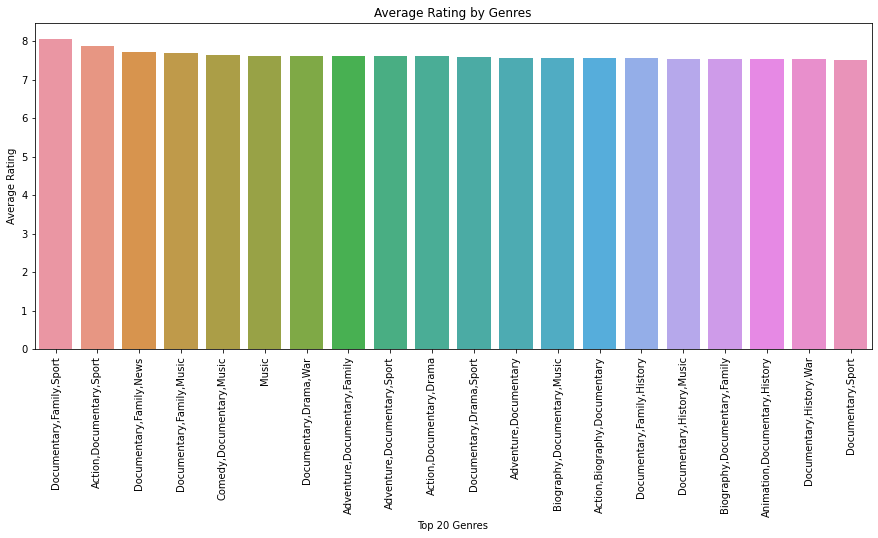

In [33]:
fig,ax = plt.subplots(figsize=(15,6))

sns.barplot(data=imdbGenreRatings[:20],x='genres',y='genreRating')
plt.xticks(rotation=90)
ax.set(xlabel='Top 20 Genres',ylabel='Average Rating',title='Average Rating by Genres')

<AxesSubplot:xlabel='genreRating', ylabel='Count'>

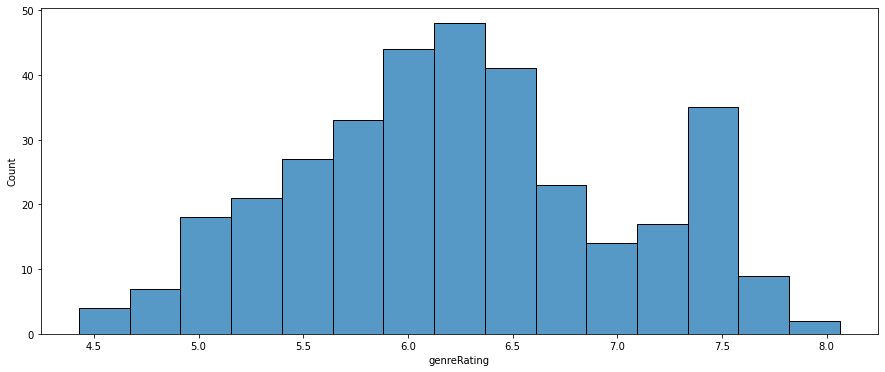

In [21]:
fig,ax = plt.subplots(figsize=(15,6))

sns.histplot(data=imdbGenreRatings,x='genreRating',bins=15)

In [22]:
imdbMovies['Genres'] = imdbMovies['Genres'].str.split(',')

In [23]:
sns.scatterplot(x=imdbMovies['Runtime'],y=imdbMovies['Rating'])

AttributeError: module 'seaborn' has no attribute 'scatter'

In [24]:
pd.read_sql("""

SELECT *
FROM movie_basics as mb
    JOIN movie_ratings as mr
        ON mr.movie_id = mb.movie_id
    JOIN 
WHERE mr.numvotes > 1000

""",con)

DatabaseError: Execution failed on sql '

SELECT *
FROM movie_basics as mb
    JOIN movie_ratings as mr
        ON mr.movie_id = mb.movie_id
    JOIN 
WHERE mr.numvotes > 1000

': near "WHERE": syntax error

In [25]:
pd.read_sql("""

SELECT *
FROM known_for as k
    JOIN writers as w
        ON w.movie_id = k.movie_id
    JOIN persons as p
        ON p.person_id = w.person_id
    JOIN movie_basics as m
        ON m.movie_id = w.movie_id

""",con)

,person_id,movie_id,movie_id,person_id,person_id,primary_name,birth_year,death_year,primary_profession,movie_id,primary_title,original_title,start_year,runtime_minutes,genres
0,nm0061671,tt0837562,tt0837562,nm0063165,nm0063165,Peter Baynham,NaN,NaN,"writer,actor,producer",tt0837562,Hotel Transylvania,Hotel Transylvania,2012,91.0,"Animation,Comedy,Family"
1,nm0061671,tt0837562,tt0837562,nm0244110,nm0244110,Todd Durham,NaN,NaN,"writer,director,producer",tt0837562,Hotel Transylvania,Hotel Transylvania,2012,91.0,"Animation,Comedy,Family"
2,nm0061671,tt0837562,tt0837562,nm0806912,nm0806912,Robert Smigel,1960.0,NaN,"writer,producer,actor",tt0837562,Hotel Transylvania,Hotel Transylvania,2012,91.0,"Animation,Comedy,Family"
3,nm0061671,tt0837562,tt0837562,nm1087952,nm1087952,Dan Hageman,NaN,NaN,"writer,producer,miscellaneous",tt0837562,Hotel Transylvania,Hotel Transylvania,2012,91.0,"Animation,Comedy,Family"
4,nm0061671,tt0837562,tt0837562,nm1156984,nm1156984,Kevin Hageman,NaN,NaN,"writer,producer,actor",tt0837562,Hotel Transylvania,Hotel Transylvania,2012,91.0,"Animation,Comedy,Family"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3383101,nm9993380,tt8743182,tt8743182,nm9993379,nm9993379,Fanny Hozleiter,1988.0,NaN,"director,actress,writer",tt8743182,Now and Not Later - Embrace the Moment,Now and Not Later - Embrace the Moment,2019,NaN,"Biography,Comedy,Drama"
3383102,nm9993380,tt8743182,tt8743182,nm9993379,nm9993379,Fanny Hozleiter,1988.0,NaN,"director,actress,writer",tt8743182,Now and Not Later - Embrace the Moment,Now and Not Later - Embrace the Moment,2019,NaN,"Biography,Comedy,Drama"
3383103,nm9993380,tt8743182,tt8743182,nm9993380,nm9993380,Pegasus Envoyé,NaN,NaN,"director,actor,writer",tt8743182,Now and Not Later - Embrace the Moment,Now and Not Later - Embrace the Moment,2019,NaN,"Biography,Comedy,Drama"
3383104,nm9993380,tt8743182,tt8743182,nm9993380,nm9993380,Pegasus Envoyé,NaN,NaN,"director,actor,writer",tt8743182,Now and Not Later - Embrace the Moment,Now and Not Later - Embrace the Moment,2019,NaN,"Biography,Comedy,Drama"


In [26]:
actorRatings = pd.read_sql("""

SELECT pe.primary_name AS actor,
    AVG(mr.averagerating) AS averageRating
FROM principals as pr
    JOIN persons as pe
        ON pr.person_id = pe.person_id
    JOIN movie_basics as m
        ON m.movie_id = pr.movie_id
    JOIN movie_ratings as mr
        ON m.movie_id = mr.movie_id
WHERE category = 'actor' AND mr.numvotes > 1000
GROUP BY actor
ORDER BY averageRating DESC

""",con)

with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(actorRatings)

,actor,averageRating
0,Rezo Chkhikvishvili,9.600000
1,Gogi Turkiashvili,9.600000
2,Giorgi Megrelishvili,9.600000
3,Uddika Premarathna,9.500000
4,Roshan Ravindra,9.500000
5,Priit Võigemast,9.300000
6,Patrick Hume,9.300000
7,Partho Barua,9.300000
8,Ozan Agaç,9.300000
9,Donavon Warren,9.300000


In [ ]:
directorRatings = pd.read_sql("""

SELECT pe.primary_name AS director,
    AVG(mr.averagerating) AS averageRating,
    COUNT(mr.averagerating) as movieCount
FROM principals as pr
    JOIN persons as pe
        ON pr.person_id = pe.person_id
    JOIN movie_basics as m
        ON m.movie_id = pr.movie_id
    JOIN movie_ratings as mr
        ON m.movie_id = mr.movie_id
WHERE category = 'director' AND mr.numvotes > 100
GROUP BY primary_name
HAVING movieCount > 1
ORDER BY averageRating DESC

""",con)

with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(directorRatings)

In [ ]:
ax,fig = plt.subplots(figsize=(10,6))

sns.histplot(data=directorRatings,x='averageRating')

In [ ]:
movieInfo = pd.read_sql("""

SELECT mb.primary_title AS title,
    mb.runtime_minutes AS runtime,
    mr.averagerating AS movieRating
FROM movie_basics AS mb
    JOIN movie_ratings AS mr
        ON mr.movie_id = mb.movie_id
WHERE mr.numvotes > 100

""",con)

In [ ]:
ax,fig = plt.subplots(figsize=(10,6))

sns.histplot(data=movieInfo,x='movieRating')

In [ ]:
runtimeRatingData = pd.read_sql("""

SELECT mb.genres AS genre,
    AVG(mb.runtime_minutes) AS runtime,
    AVG(mr.averagerating) AS rating,
    COUNT(mr.averagerating) as movieCount
FROM movie_basics AS mb
    JOIN movie_ratings AS mr
        ON mr.movie_id = mb.movie_id
GROUP BY genre

""",con)

# runtimeRatingData['genre'] = runtimeRatingData['genre'].str.split(',')
runtimeRatingData

Dropped null values since they can't be used

In [31]:
getMean = pd.read_sql("""

SELECT *
FROM movie_ratings

""",con)

In [32]:
getMean['numvotes'].describe()

count    7.385600e+04
mean     3.523662e+03
std      3.029402e+04
min      5.000000e+00
25%      1.400000e+01
50%      4.900000e+01
75%      2.820000e+02
max      1.841066e+06
Name: numvotes, dtype: float64

In [34]:
!ls ../../zippedData

bom.movie_gross.csv.gz
im.db
im.db.zip
rt.movie_info.tsv.gz
rt.reviews.tsv.gz
tmdb.movies.csv.gz
tn.movie_budgets.csv.gz


In [35]:
pd.read_csv('../../zippedData/bom.movie_gross.csv.gz')

,title,studio,domestic_gross,foreign_gross,year
0,Toy Story 3,BV,415000000.0,652000000,2010
1,Alice in Wonderland (2010),BV,334200000.0,691300000,2010
2,Harry Potter and the Deathly Hallows Part 1,WB,296000000.0,664300000,2010
3,Inception,WB,292600000.0,535700000,2010
4,Shrek Forever After,P/DW,238700000.0,513900000,2010
...,...,...,...,...,...
3382,The Quake,Magn.,6200.0,NaN,2018
3383,Edward II (2018 re-release),FM,4800.0,NaN,2018
3384,El Pacto,Sony,2500.0,NaN,2018
3385,The Swan,Synergetic,2400.0,NaN,2018
